# Large Bubbles Error Detection

This file contains the algorithm to detect the large bubbles inside the cardboards

In [46]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import os

In [47]:
def undistort_image(image, mtx, dist):
    """
    Undistort the image using the camera matrix and distortion coefficients.
    """
    h, w = image.shape[:2]
    new_camera_mtx, roi = cv.getOptimalNewCameraMatrix(mtx, dist, (w, h), 1, (w, h))
    undistorted_img = cv.undistort(image, mtx, dist, None, new_camera_mtx)
    return undistorted_img

def mask_image(image, kernelSize):
    # Recieves blurred image and returns a mask of the contour
    contour_mask = np.zeros_like(image, dtype=np.uint8)

    # Thresholding the imnage OTSU gives us the optimal threshold value
    _ , th_Bin_OTSU = cv.threshold(image, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
    # Find the contours in the image
    contours, _ = cv.findContours(th_Bin_OTSU, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

    # We search the biggest contour Area Based
    contour_max = max(contours, key=cv.contourArea)

    # Bounding box of the biggest contour
    x, y, w, h = cv.boundingRect(contour_max)

    # We expand the ROI
    margin = 10  # Additional pixels to the ROI
    x_roi = max(x - margin, 0)
    y_roi = max(y - margin, 0)
    w_roi = min(w + 2 * margin, th_Bin_OTSU.shape[1] - x_roi)
    h_roi = min(h + 2 * margin, th_Bin_OTSU.shape[0] - y_roi)  #With ROI coordinates we can select the desired part of the image
    # We use the ROI found in the previous step
    roi = th_Bin_OTSU[y_roi:y_roi+h_roi, x_roi:x_roi+w_roi]

    # We apply the canny on the ROI
    canny_edges_roi = cv.Canny(roi, 50, 110, L2gradient=True)
    # print("Borders detected:", np.count_nonzero(canny_edges_roi))

    # Dilate the edges
    kernel = np.ones((2, 2), np.uint8)
    canny_edges = cv.dilate(canny_edges_roi, kernel, iterations=1)
    
    # Crear máscara del mismo tamaño que la imagen, inicialmente negra
    contour_mask = np.zeros_like(image, dtype=np.uint8)
    
    # Obtener el contorno más grande en la imagen (dentro del ROI binarizado)
    contours, _ = cv.findContours(canny_edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    max_contour = max(contours, key=cv.contourArea)

    # Usar contorno real en lugar del convex hull
    contour_offset = max_contour + np.array([[[x_roi, y_roi]]])

    # Dibujar el contorno exterior (relleno blanco) sobre la máscara
    cv.drawContours(contour_mask, [contour_offset], -1, color=255, thickness=-1)

    # Aplicar erosión para "encoger" el área del contorno
    mask_size = kernelSize # tamaño del kernel de erosión
    kernel = np.ones((mask_size, mask_size), np.uint8)  # puedes ajustar el tamaño para más o menos reducción
    contour_mask_eroded = cv.erode(contour_mask, kernel, iterations=1)
    
    return contour_mask_eroded

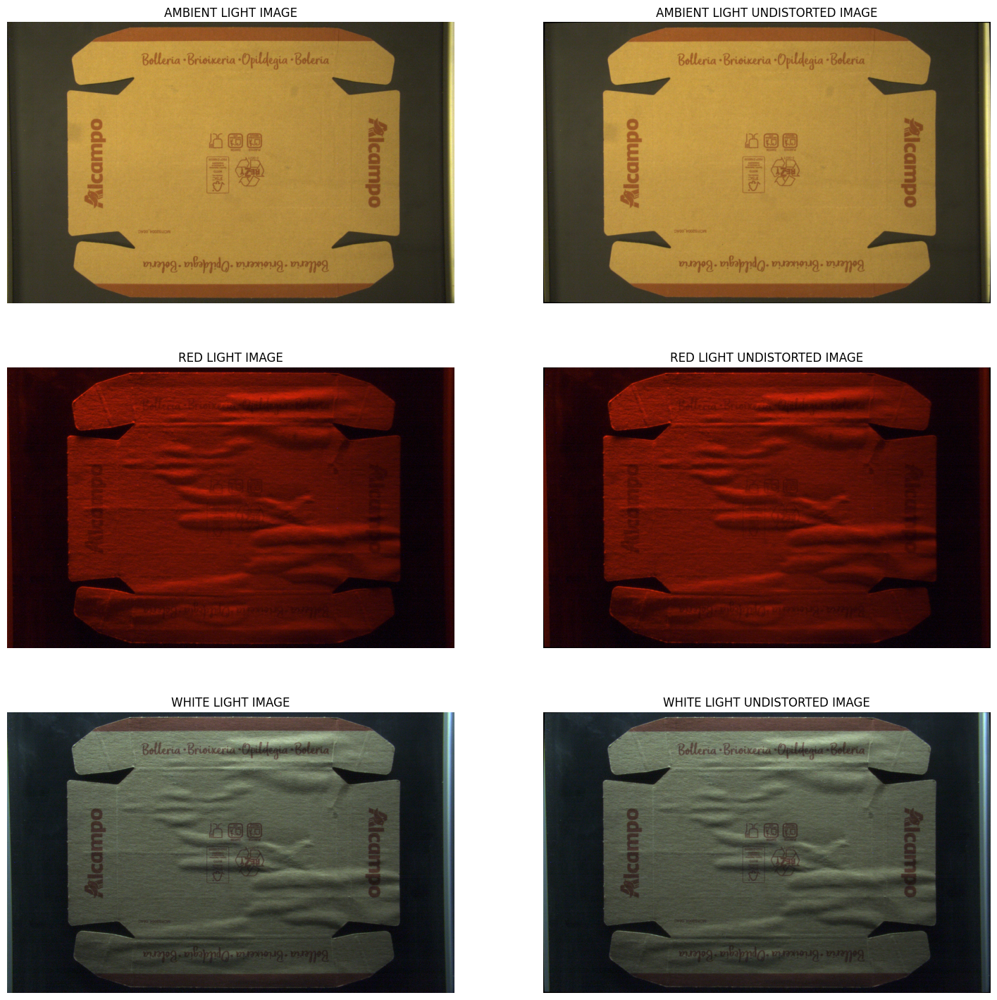

In [48]:
# Working directory
baseFolder = os.getcwd()

# image Number
imageNumber = 1

if imageNumber == 1:
    # Load the image with Ambient Light
    AL_img = cv.imread(os.path.join(baseFolder, 'FINAL_PHOTOS', 'BUBBLES_RETAKE', '1_ROOM_LIGHT.png'))

    # Load the image with the red Light
    RL_img = cv.imread(os.path.join(baseFolder, 'FINAL_PHOTOS', 'BUBBLES_RETAKE', '1_RED_LIGHT_2.png'))

    # Load the iage with the white Light
    WL_img = cv.imread(os.path.join(baseFolder, 'FINAL_PHOTOS', 'BUBBLES_RETAKE', '1_WHITE_LIGHT.png'))
else:
    # Load the image with Ambient Light
    AL_img = cv.imread(os.path.join(baseFolder, 'FINAL_PHOTOS', 'BUBBLES_RETAKE', '2_WHITE_LIGHT_2.png'))

    # Load the image with the red Light
    RL_img = cv.imread(os.path.join(baseFolder, 'FINAL_PHOTOS', 'BUBBLES_RETAKE', '2_RED_LIGHT_2.png'))

    # Load the iage with the white Light
    WL_img = cv.imread(os.path.join(baseFolder, 'FINAL_PHOTOS', 'BUBBLES_RETAKE', '2_WHITE_LIGHT_1.png'))

# Loading the camera parameters obtained from the calibration process
cameraParameters = np.load(baseFolder + "/calibration/camera_lens_12mm.npz")

# We extract the camera matrix and distortion coefficients, through the keys in the dictionary
mtx = cameraParameters['mtx']
dist = cameraParameters['dist']
res = cameraParameters['res']

# Undistort the images using the camera parameters
udst_AL_img = undistort_image(AL_img, mtx, dist)
udst_RL_img = undistort_image(RL_img, mtx, dist)
udst_WL_img = undistort_image(WL_img, mtx, dist)

plt.figure(figsize=(18, 18))

plt.subplot(3, 2, 1)
plt.imshow(cv.cvtColor(AL_img, cv.COLOR_BGR2RGB))
plt.axis("off")
plt.title("AMBIENT LIGHT IMAGE")
plt.subplot(3, 2, 2)
plt.imshow(cv.cvtColor(udst_AL_img, cv.COLOR_BGR2RGB))
plt.axis("off")
plt.title("AMBIENT LIGHT UNDISTORTED IMAGE")

plt.subplot(3, 2, 3)
plt.imshow(cv.cvtColor(RL_img, cv.COLOR_BGR2RGB))
plt.axis("off")
plt.title("RED LIGHT IMAGE")
plt.subplot(3, 2, 4)
plt.imshow(cv.cvtColor(udst_RL_img, cv.COLOR_BGR2RGB))
plt.axis("off")
plt.title("RED LIGHT UNDISTORTED IMAGE")

plt.subplot(3, 2, 5)
plt.imshow(cv.cvtColor(WL_img, cv.COLOR_BGR2RGB))
plt.axis("off")
plt.title("WHITE LIGHT IMAGE")
plt.subplot(3, 2, 6)
plt.imshow(cv.cvtColor(udst_WL_img, cv.COLOR_BGR2RGB))
plt.axis("off")
plt.title("WHITE LIGHT UNDISTORTED IMAGE")

plt.show()


## Region of Interest

We are going to focus on the ambient ligth image for finding the borders of the cardboard and use only this section of the image, for that reason we are going to start by doing an optimal threshold of the image, using OTSU

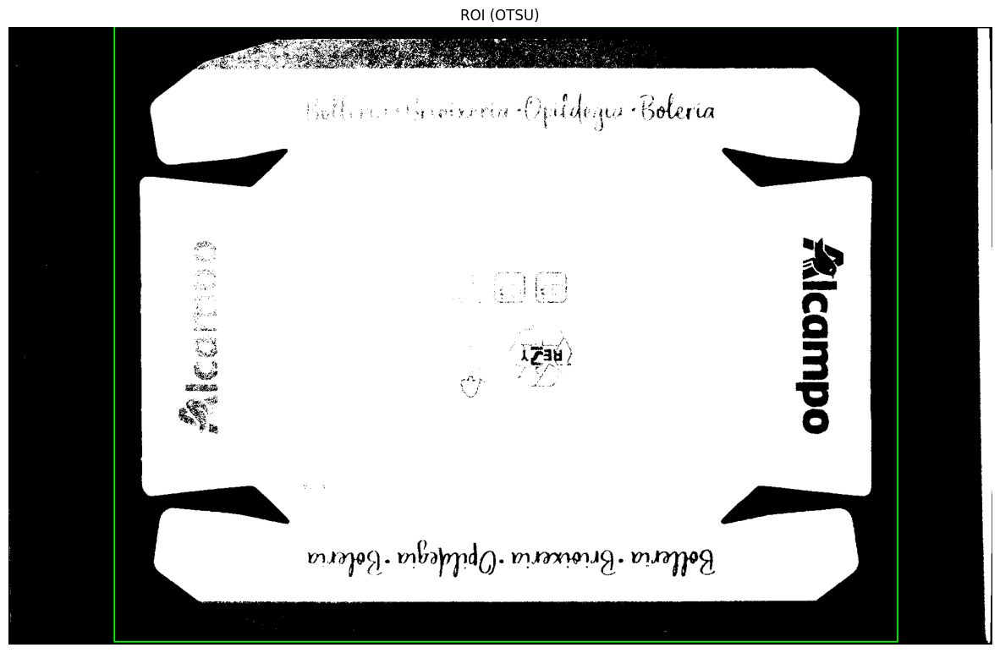

In [49]:
# Thresholding the imnage OTSU gives us the optimal threshold value
udst_AL_gray = cv.cvtColor(udst_AL_img, cv.COLOR_BGR2GRAY)
_ , th_Bin_OTSU = cv.threshold(udst_AL_gray, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

# Find the contours in the image
contours, _ = cv.findContours(th_Bin_OTSU, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# We search the biggest contour Area Based
contour_max = max(contours, key=cv.contourArea)

# Bounding box of the biggest contour
x, y, w, h = cv.boundingRect(contour_max)

# We expand the ROI
margin = 50  # Additional pixels to the ROI
x_roi = max(x - margin, 0)
y_roi = max(y - margin, 0)
w_roi = min(w + 2 * margin, th_Bin_OTSU.shape[1] - x_roi)
h_roi = min(h + 2 * margin, th_Bin_OTSU.shape[0] - y_roi)

# Draw a green rectangle using BGR
img_with_roi = cv.cvtColor(th_Bin_OTSU, cv.COLOR_GRAY2BGR)
cv.rectangle(img_with_roi, (x_roi, y_roi), (x_roi + w_roi, y_roi + h_roi), (0, 255, 0), 2)

# We show the image with the ROI detected
plt.figure(figsize=(15, 10))
plt.imshow(img_with_roi)
plt.title("ROI (OTSU)")
plt.axis("off")
plt.show()

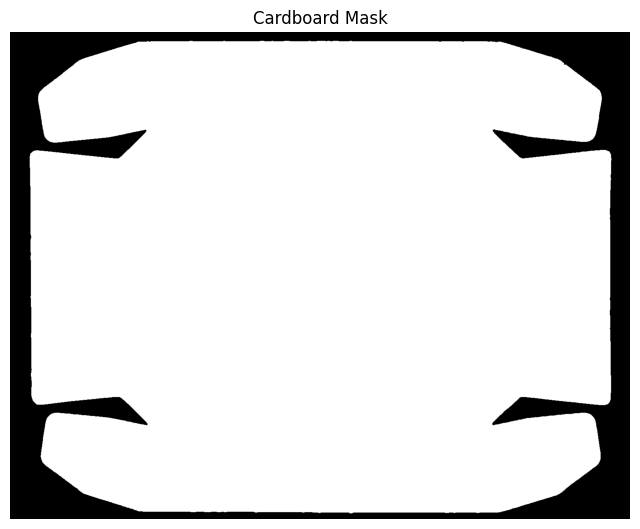

In [50]:
# Wa apply a gaussian blur to the image to reduce noise
blur = cv.GaussianBlur(udst_AL_gray, (5, 5), 0)

# Start by extracting the ROI from the blurre image
roi = blur[y_roi:y_roi+h_roi, x_roi:x_roi+w_roi]

# We apply the Canny edge detection algorithm to the ROI
canny_edges_roi = cv.Canny(roi, 40, 130, L2gradient=True)

# We are going to dilate the edges to make them more pronounced
kernel = np.ones((2, 2), np.uint8)
canny_edges = cv.dilate(canny_edges_roi, kernel, iterations=1)

# We had to add a morphological operation to close small gaps in the edges
# Required to connect the small red pieces in the borders of the cardboard
kernel_close = np.ones((5, 5), np.uint8)
closed = cv.morphologyEx(canny_edges, cv.MORPH_CLOSE, kernel_close)

# This final step is to assure that the edges are well defined and the 
# cardboard contour is clearly visible
dilated = cv.dilate(closed, np.ones((3, 3), np.uint8), iterations=1)

# We find the contours in the image
contours, _ = cv.findContours(dilated, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# We take the largest contour based on area
max_contour = max(contours, key=cv.contourArea)

# We create the cardboard mask
cardboard_mask = np.zeros_like(canny_edges, dtype=np.uint8)
cv.drawContours(cardboard_mask, [max_contour], -1, 255, thickness=cv.FILLED)

# 9. Visualizar resultado
plt.figure(figsize=(8, 8))
plt.imshow(cardboard_mask, cmap='gray')
plt.title("Cardboard Mask")
plt.axis("off")
plt.show()

## Analysis on the Red Light photo

Based on the found ROI and cardboard mask we are ready to work on the cardboard iluminated in tangential direction

0 1210 208 1541


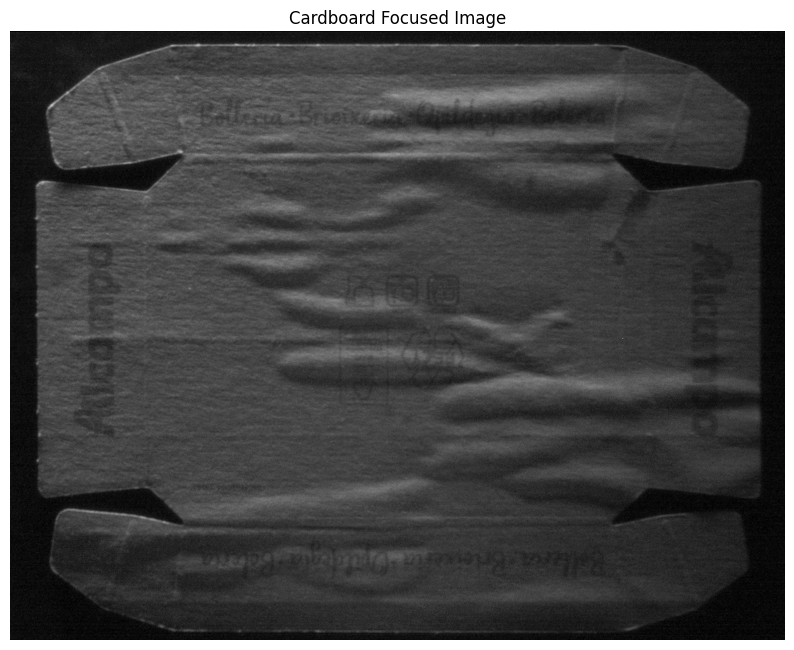

In [51]:
# For the analysis we need to convert the image to grayscale
udst_RL_gray = cv.cvtColor(udst_RL_img, cv.COLOR_BGR2GRAY)
udst_WL_gray = cv.cvtColor(udst_WL_img, cv.COLOR_BGR2GRAY)

print(y_roi, h_roi, x_roi, w_roi)

# Start by extracting the ROI from the Red Ligthed image
roi_RL_img = udst_RL_gray[y_roi:y_roi+h_roi, x_roi:x_roi+w_roi]
roi_AL_img = udst_AL_gray[y_roi:y_roi+h_roi, x_roi:x_roi+w_roi]
roi_WL_img = udst_WL_gray[y_roi:y_roi+h_roi, x_roi:x_roi+w_roi]

# We apply the mask to the red light image
cardboard_img = cv.bitwise_and(roi_RL_img, cardboard_mask)

# Mostrar el resultado
plt.figure(figsize=(10, 8))
plt.imshow(roi_RL_img, cmap='gray')
plt.title("Cardboard Focused Image")
plt.axis("off")
plt.show()

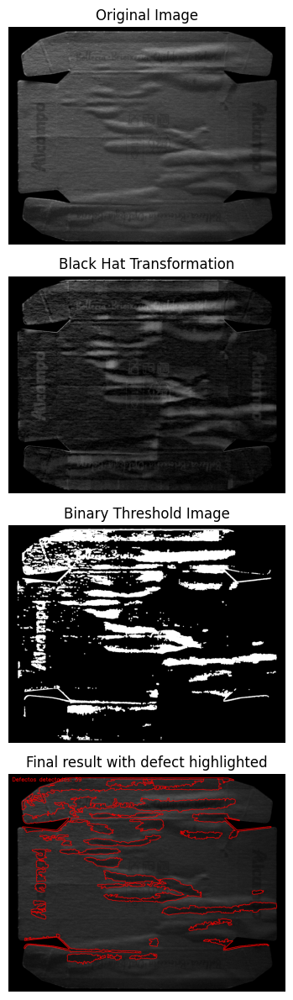

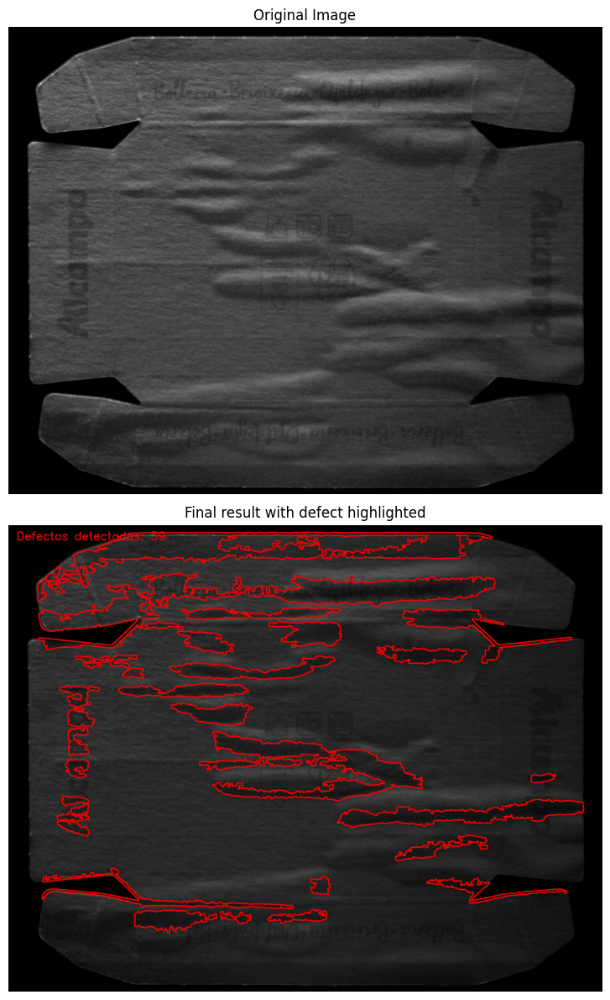

In [52]:
# We apply a Gaussian blur to the cardboard image to reduce the noise
gray = cv.GaussianBlur(cardboard_img, (5, 5), 0)

# The "Black Hat" morphological operation is used to highlight dark regions on a light background.
kernel_size = (75, 75)
kernel = cv.getStructuringElement(cv.MORPH_RECT, kernel_size)

blackhat = cv.morphologyEx(gray, cv.MORPH_BLACKHAT, kernel)

# We apply the cardbord mask to the blackhat image
blackhat = cv.bitwise_and(blackhat, cardboard_mask)

# We employ a binary threshold to create a mask of the defects
_, thresh = cv.threshold(blackhat, 18, 255, cv.THRESH_BINARY)

# We dilate the thresholded image to enhance the visibility of defects
thresh = cv.dilate(thresh, None, iterations=2)

# Find contours in the thresholded image
contours, _ = cv.findContours(thresh.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

output_image = cv.cvtColor(cardboard_img, cv.COLOR_GRAY2BGR)

min_defect_area = 1000
detected_defects = 0

for contour in contours:
    if cv.contourArea(contour) > min_defect_area:
        detected_defects += 1
        # Dibujar en rojo
        cv.drawContours(output_image, [contour], -1, (0, 0, 255), 2)

# Cambiar el color del texto a rojo
cv.putText(output_image, f"Defectos detectados: {detected_defects}", (20, 40), 
            cv.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

# 6. Mostrar los resultados
plt.figure(figsize=(20, 12))
plt.subplot(4, 1, 1)
plt.imshow(cardboard_img, cmap='gray')
plt.title('Original Image')
plt.axis('off')
plt.subplot(4, 1, 2)
plt.imshow(blackhat, cmap='gray')
plt.title('Black Hat Transformation')
plt.axis('off')
plt.subplot(4, 1, 3)
plt.imshow(thresh, cmap='gray')
plt.title('Binary Threshold Image')
plt.axis('off')
plt.subplot(4, 1, 4)
plt.imshow(cv.cvtColor(output_image, cv.COLOR_BGR2RGB))
plt.title('Final result with defect highlighted')
plt.axis('off')
plt.tight_layout()
plt.show()

# 6. Mostrar los resultados
plt.figure(figsize=(20, 12))
plt.subplot(2, 1, 1)
plt.imshow(cardboard_img, cmap='gray')
plt.title('Original Image')
plt.axis('off')
plt.subplot(2, 1, 2)
plt.imshow(cv.cvtColor(output_image, cv.COLOR_BGR2RGB))
plt.title('Final result with defect highlighted')
plt.axis('off')
plt.tight_layout()
plt.show()


## Algorithm 2
Another algorithm is proposed

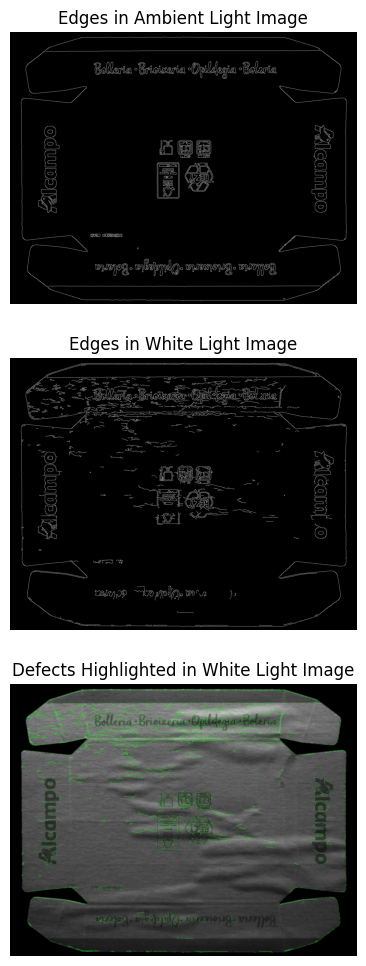

In [53]:
# We apply the mask to the ambient light and white light images
ambient_image = cv.bitwise_and(roi_AL_img, cardboard_mask)
white_image = cv.bitwise_and(roi_WL_img, cardboard_mask)

# We apply a Gaussian blur to the ambient light image to reduce the noise
ambient_blurred = cv.GaussianBlur(ambient_image, (5, 5), 0)
white_blurred = cv.GaussianBlur(white_image, (5, 5), 0)

# We define the thresholds for the Canny edge detection
th1 = 30
th2 = 80

# We detect the edges in the ambient light image
ambient_edges = cv.Canny(ambient_blurred, th1, th2, apertureSize=3)
# We detect the edges in the white light image
white_edges = cv.Canny(white_blurred, th1, th2, apertureSize=3)

# WE find the edges that are not common in both images,
# these edges should be the defects that we are looking for
defect_edges = cv.bitwise_and(white_edges, cv.bitwise_not(ambient_edges))

# We search for the contours in the masked image
contours_defects, _ = cv.findContours(defect_edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# We draw the found contours in green
contour_vis = cv.cvtColor(white_blurred, cv.COLOR_GRAY2BGR)
cv.drawContours(contour_vis, contours_defects, -1, (0,255,0), 1)

# The result is shown
plt.figure(figsize=(20, 12))
plt.subplot(3, 1, 1)
plt.imshow(cv.cvtColor(ambient_edges, cv.COLOR_GRAY2RGB))
plt.title("Edges in Ambient Light Image")
plt.axis("off")
plt.subplot(3, 1, 2)
plt.imshow(cv.cvtColor(white_edges, cv.COLOR_GRAY2RGB))
plt.title("Edges in White Light Image")
plt.axis("off")
plt.subplot(3, 1, 3)
plt.imshow(cv.cvtColor(contour_vis, cv.COLOR_BGR2RGB))
plt.title("Defects Highlighted in White Light Image")
plt.axis("off")
plt.show()



In [54]:
print("roi_WL_img:", roi_WL_img.shape, roi_WL_img.dtype)
print("cardboard_mask:", cardboard_mask.shape, cardboard_mask.dtype)


roi_WL_img: (1210, 1541) uint8
cardboard_mask: (1210, 1541) uint8


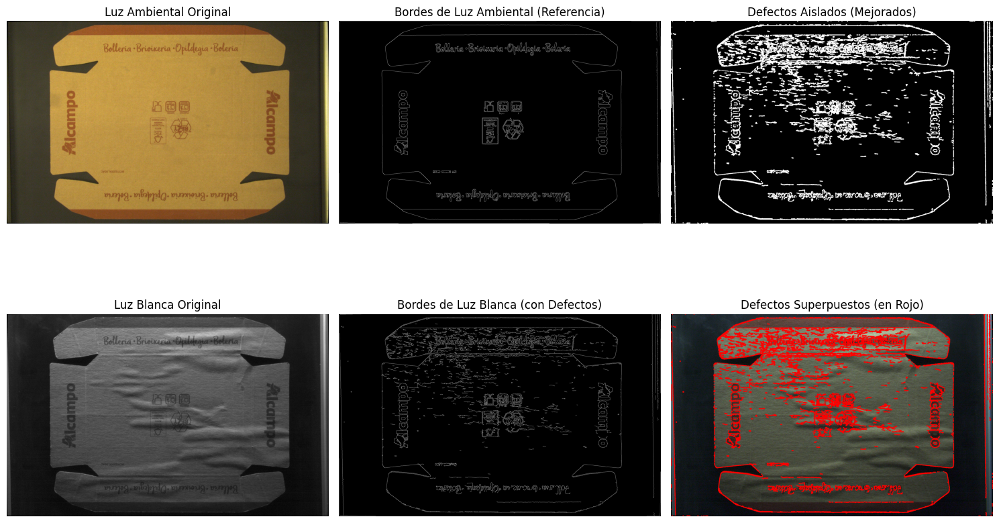

In [55]:
# --- 2. Pre-procesamiento ---
# Convertir a escala de grises
gray_ambient = cv.cvtColor(udst_AL_img, cv.COLOR_BGR2GRAY)
gray_white = cv.cvtColor(udst_WL_img, cv.COLOR_BGR2GRAY)

# Aplicar un desenfoque Gaussiano para reducir el ruido y mejorar la detección de bordes
# Un kernel de 5x5 es un buen punto de partida.
blur_ambient = cv.GaussianBlur(gray_ambient, (5, 5), 0)
blur_white = cv.GaussianBlur(gray_white, (5, 5), 0)


# --- 3. Detección de Bordes (Canny) ---
# Los umbrales (thresholds) pueden necesitar ajuste.
# Un umbral bajo (50) y uno alto (150) suelen funcionar bien.
edges_ambient = cv.Canny(blur_ambient, 50, 100)
edges_white = cv.Canny(blur_white, 30, 70)


# --- 4. Encontrar los Defectos ---
# Restamos los bordes de la imagen de referencia (ambiental) a los de la imagen con luz blanca.
# Esto nos dejará solo con los bordes que corresponden a los defectos físicos.
defects_mask = cv.subtract(edges_white, edges_ambient)

# --- Opcional: Limpieza Morfológica ---
# Se puede aplicar una operación de dilatación para hacer los defectos más visibles y sólidos.
kernel = np.ones((5, 5), np.uint8)
defects_mask_enhanced = cv.dilate(defects_mask, kernel, iterations=1)


# --- 5. Visualización de Resultados ---
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.title('Luz Ambiental Original')
plt.imshow(cv.cvtColor(udst_AL_img, cv.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title('Bordes de Luz Ambiental (Referencia)')
plt.imshow(edges_ambient, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title('Defectos Aislados (Mejorados)')
plt.imshow(defects_mask_enhanced, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.title('Luz Blanca Original')
plt.imshow(cv.cvtColor(gray_white, cv.COLOR_BGR2RGB))
#plt.imshow(cv.cvtColor(udst_RL_img, cv.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title('Bordes de Luz Blanca (con Defectos)')
plt.imshow(edges_white, cmap='gray')
plt.axis('off')

# Superponer los defectos en la imagen original para una mejor visualización
# Creamos una copia de la imagen de luz blanca para no modificar la original
overlay_image = udst_WL_img.copy()
# Coloreamos los defectos de rojo para que resalten
overlay_image[defects_mask_enhanced != 0] = [0, 0, 255] # Formato BGR para OpenCV

plt.subplot(2, 3, 6)
plt.title('Defectos Superpuestos (en Rojo)')
plt.imshow(cv.cvtColor(overlay_image, cv.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()

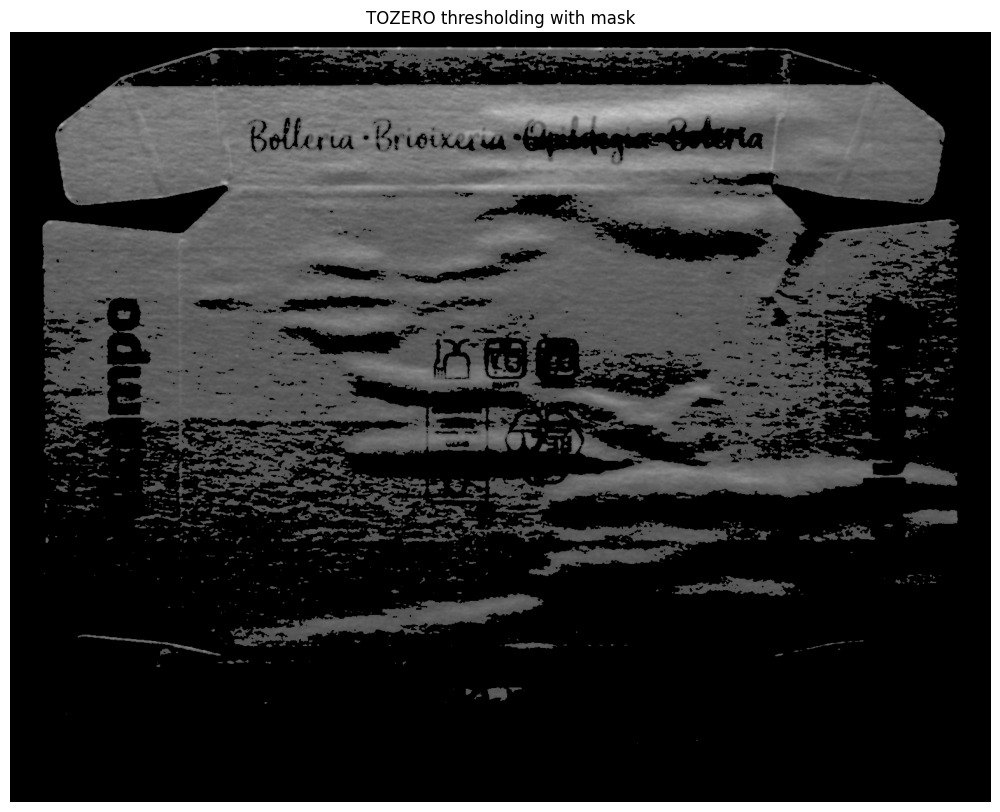

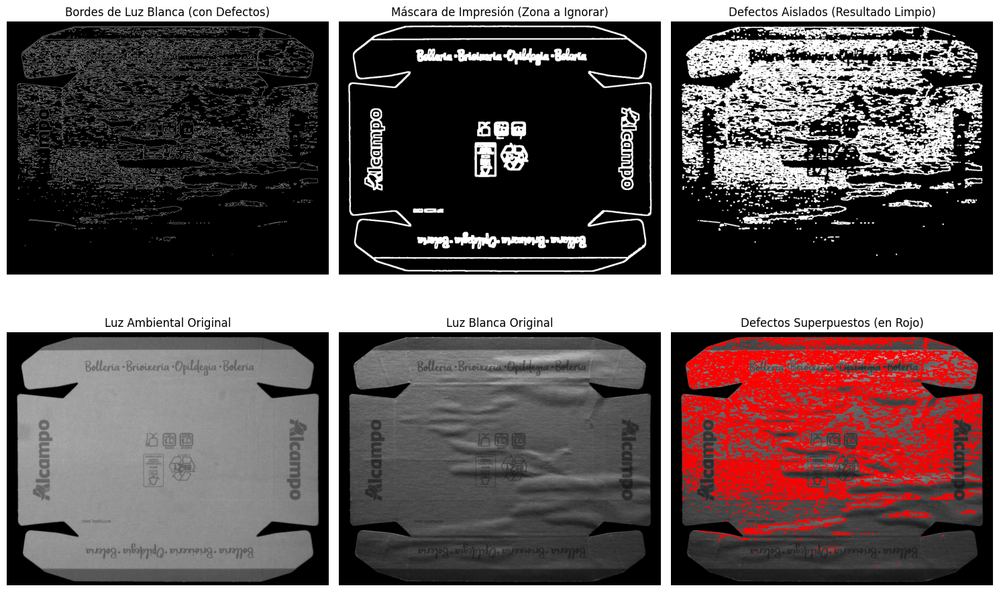

In [56]:
# Aplicar un desenfoque Gaussiano para reducir el ruido y mejorar la detección de bordes
blur_ambient = cv.GaussianBlur(ambient_image, (5, 5), 0)
blur_white = cv.GaussianBlur(white_image, (5, 5), 0)

# Pre-procesamiento de la imagen blanca
# We apply the thresholding to the original image
thValue = 80
_, thTOZERO_full = cv.threshold(blur_white, thValue, 255, cv.THRESH_TOZERO)

# Finally, we apply the mask to the thresholded image (we only take care of the area inside the hull)
thTOZERO_masked = cv.bitwise_and(thTOZERO_full, thTOZERO_full, mask=cardboard_mask)

# The result is shown
plt.figure(figsize=(15, 10))
plt.imshow(thTOZERO_masked, cmap="gray", vmin=0, vmax=255)
plt.title("TOZERO thresholding with mask")
plt.axis("off")
plt.show()


# --- 3. Detección de Bordes (Canny) ---
# (Se conservan tus umbrales optimizados)
edges_ambient = cv.Canny(blur_ambient, 50, 100)
edges_white = cv.Canny(thTOZERO_masked, 20, 50)


# --- 4. Encontrar los Defectos (MÉTODO MODIFICADO CON MÁSCARA) ---
# En lugar de restar, crearemos una máscara para ignorar las áreas impresas.

# Paso 4.1: Crear una "zona de tolerancia" dilatando los bordes de la impresión.
# Este es el parámetro clave que puedes ajustar. Un kernel más grande (ej. 9x9)
# eliminará más ruido cerca del texto. Uno más pequeño (ej. 5x5) será menos agresivo.
print_mask_kernel = np.ones((7, 7), np.uint8)
mask_print_area = cv.dilate(edges_ambient, print_mask_kernel, iterations=1)

# Paso 4.2: Invertir la máscara para que las áreas de "no-impresión" queden activas.
inverted_mask = cv.bitwise_not(mask_print_area)

# Paso 4.3: Aplicar la máscara. Esto borra todos los bordes en la imagen de luz blanca
# que caen dentro de la zona de la impresión, dejando solo los defectos.
defects_mask = cv.bitwise_and(edges_white, edges_white, mask=inverted_mask)


# --- Limpieza Morfológica Opcional ---
# (Tu código se mantiene igual, ahora aplicado al resultado limpio)
# Se puede aplicar una operación de dilatación para hacer los defectos más visibles y sólidos.
enhancement_kernel = np.ones((5, 5), np.uint8)
defects_mask_enhanced = cv.dilate(defects_mask, enhancement_kernel, iterations=1)


# --- 5. Visualización de Resultados (MODIFICADA para reflejar el nuevo método) ---
plt.figure(figsize=(15, 10))

# Fila superior: El proceso de enmascaramiento
plt.subplot(2, 3, 1)
plt.title('Bordes de Luz Blanca (con Defectos)')
plt.imshow(edges_white, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title('Máscara de Impresión (Zona a Ignorar)')
plt.imshow(mask_print_area, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title('Defectos Aislados (Resultado Limpio)')
plt.imshow(defects_mask_enhanced, cmap='gray')
plt.axis('off')

# Fila inferior: Comparativa de originales y resultado final
plt.subplot(2, 3, 4)
plt.title('Luz Ambiental Original')
plt.imshow(cv.cvtColor(ambient_image, cv.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title('Luz Blanca Original')
# Corregido: Mostrar la imagen a color original, no la de escala de grises
plt.imshow(cv.cvtColor(white_image, cv.COLOR_BGR2RGB))
plt.axis('off')

# Superponer los defectos en la imagen original
overlay_image = cv.cvtColor(white_image, cv.COLOR_GRAY2BGR)
overlay_image[defects_mask_enhanced != 0] = [0, 0, 255] # Defectos en rojo (formato BGR)

plt.subplot(2, 3, 6)
plt.title('Defectos Superpuestos (en Rojo)')
plt.imshow(cv.cvtColor(overlay_image, cv.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()

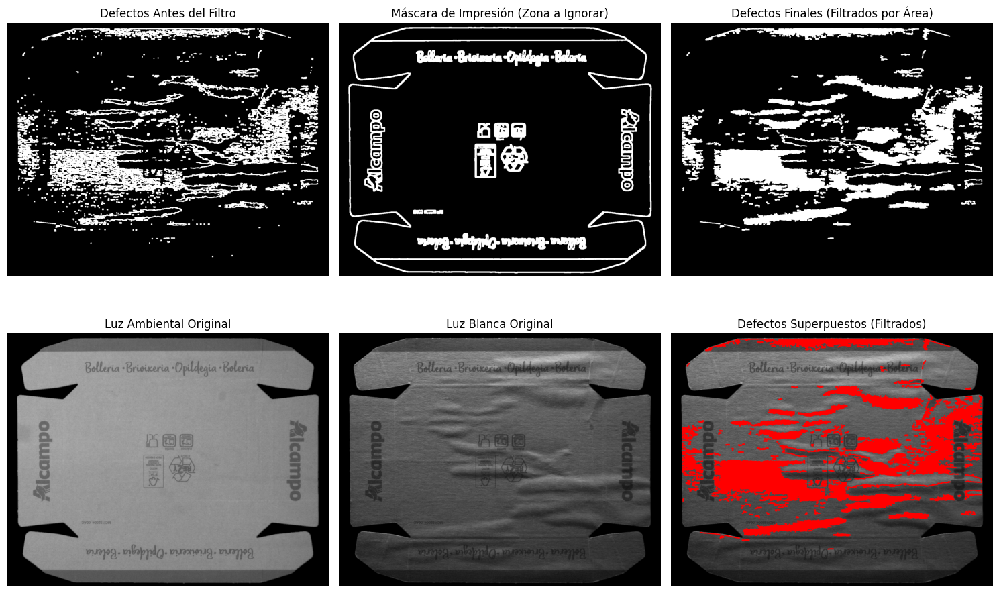

In [61]:
# Aplicar un desenfoque Gaussiano
blur_ambient = cv.GaussianBlur(ambient_image, (5, 5), 0)
blur_white = cv.GaussianBlur(white_image, (5, 5), 0)

# Pre-procesamiento de la imagen blanca con umbral TOZERO
thValue = 80
_, thTOZERO_full = cv.threshold(blur_white, thValue, 255, cv.THRESH_TOZERO)
thTOZERO_masked = cv.bitwise_and(thTOZERO_full, thTOZERO_full, mask=cardboard_mask)

# --- Detección de Bordes (Canny) ---
edges_ambient = cv.Canny(blur_ambient, 50, 100)
edges_white = cv.Canny(thTOZERO_masked, 50, 150)

# --- Encontrar los Defectos (MÉTODO CON MÁSCARA) ---
print_mask_kernel = np.ones((7, 7), np.uint8)
mask_print_area = cv.dilate(edges_ambient, print_mask_kernel, iterations=1)
inverted_mask = cv.bitwise_not(mask_print_area)
defects_mask = cv.bitwise_and(edges_white, edges_white, mask=inverted_mask)

# --- Limpieza Morfológica Opcional ---
enhancement_kernel = np.ones((5, 5), np.uint8)
defects_mask_enhanced = cv.dilate(defects_mask, enhancement_kernel, iterations=1)


# --- NUEVO: FILTRAR DEFECTOS POR ÁREA ---
# En este paso, eliminamos las detecciones que son demasiado pequeñas para ser relevantes.

# Paso 1: Definir el área mínima que debe tener un defecto para ser considerado válido (en píxeles).
# ¡ESTE ES EL PARÁMETRO CLAVE QUE DEBES AJUSTAR!
min_defect_area = 100 # Por ejemplo, no aceptar nada con menos de 100 píxeles de área.

# Paso 2: Encontrar los contornos de cada "isla" de defecto detectada.
contours, _ = cv.findContours(defects_mask_enhanced, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Paso 3: Crear una nueva máscara en negro para dibujar solo los defectos que pasen el filtro.
filtered_defects_mask = np.zeros_like(defects_mask_enhanced)

# Paso 4: Revisar cada contorno, calcular su área y si es lo suficientemente grande, dibujarlo.
for contour in contours:
    area = cv.contourArea(contour)
    if area > min_defect_area:
        # Dibujamos el contorno relleno en nuestra nueva máscara.
        cv.drawContours(filtered_defects_mask, [contour], -1, (255), thickness=cv.FILLED)


# --- Visualización de Resultados ---
# Ahora usamos la nueva máscara filtrada 'filtered_defects_mask' para la visualización final.
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.title('Defectos Antes del Filtro')
plt.imshow(defects_mask_enhanced, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title('Máscara de Impresión (Zona a Ignorar)')
plt.imshow(mask_print_area, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title('Defectos Finales (Filtrados por Área)')
plt.imshow(filtered_defects_mask, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.title('Luz Ambiental Original')
plt.imshow(cv.cvtColor(ambient_image, cv.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title('Luz Blanca Original')
plt.imshow(cv.cvtColor(white_image, cv.COLOR_BGR2RGB))
plt.axis('off')

# Superponer los defectos FILTRADOS en la imagen original
# CORRECCIÓN: Se usa .copy() para crear el overlay a partir de la imagen original a color.
overlay_image = cv.cvtColor(white_image, cv.COLOR_GRAY2BGR)
overlay_image[filtered_defects_mask != 0] = [0, 0, 255] # Defectos en rojo (formato BGR)

plt.subplot(2, 3, 6)
plt.title('Defectos Superpuestos (Filtrados)')
plt.imshow(cv.cvtColor(overlay_image, cv.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()

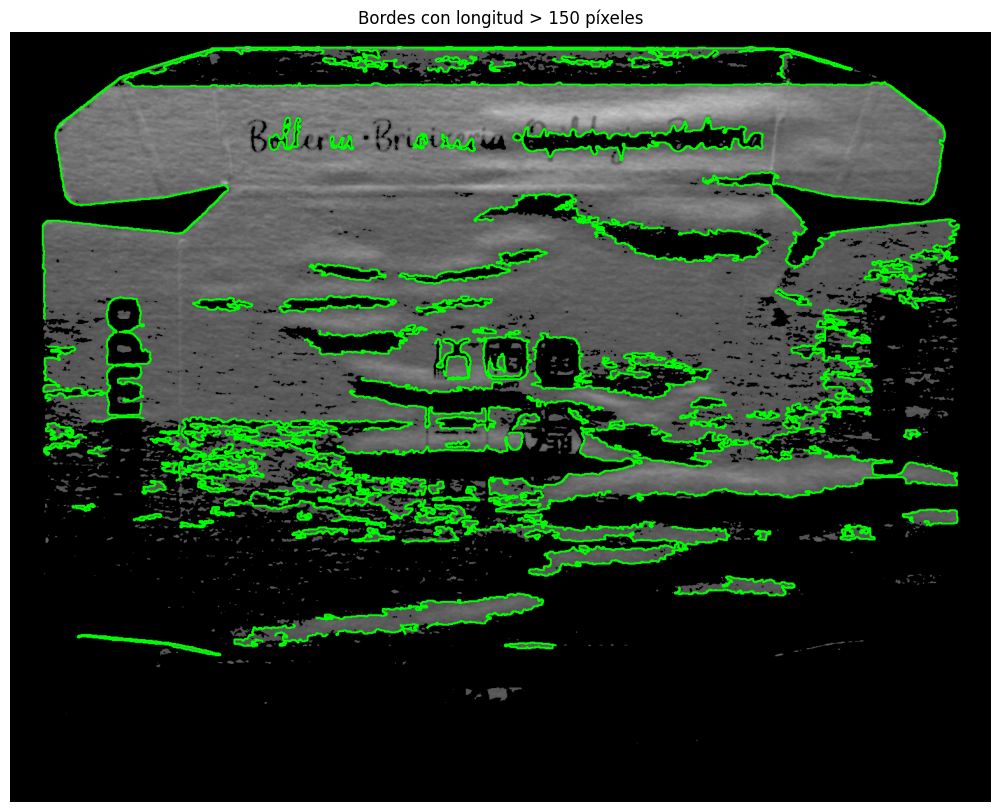

Se encontraron 2608 contornos en total.
Después de filtrar, nos quedamos con 173 contornos grandes.


In [63]:
blur_white = cv.GaussianBlur(white_image, (5, 5), 0)
thValue = 80
_, thTOZERO_full = cv.threshold(blur_white, thValue, 255, cv.THRESH_TOZERO)
thTOZERO_masked = cv.bitwise_and(thTOZERO_full, thTOZERO_full, mask=cardboard_mask)

# Aplicamos el algoritmo Canny a la imagen enmascarada
low_thresh  = 50
high_thresh = 150
edges_masked = cv.Canny(thTOZERO_masked, low_thresh, high_thresh, apertureSize=3)

# Buscamos TODOS los contornos en la imagen
contours_masked, _ = cv.findContours(edges_masked, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)


# --- NUEVO: FILTRAR CONTORNOS POR LONGITUD ---
# Aquí nos quedamos solo con los bordes que son suficientemente largos.

# Paso 1: Define la longitud mínima que debe tener un borde para ser considerado.
# ¡ESTE ES EL PARÁMETRO CLAVE QUE DEBES AJUSTAR!
min_edge_length = 150 # Por ejemplo, ignora cualquier borde con menos de 100 píxeles de longitud.

# Paso 2: Creamos una lista vacía para guardar solo los contornos grandes.
large_contours = []

# Paso 3: Recorremos cada contorno encontrado.
for contour in contours_masked:
    # Calculamos la longitud (perímetro) del contorno.
    length = cv.arcLength(contour, True)
    
    # Si la longitud supera nuestro umbral mínimo, lo guardamos.
    if length > min_edge_length:
        large_contours.append(contour)

# --- FIN DEL NUEVO BLOQUE ---


# Ahora, dibujamos solo los contornos GRANDES que hemos filtrado.
# Creamos una copia de la imagen para dibujar sobre ella.
contour_vis = cv.cvtColor(thTOZERO_masked, cv.COLOR_GRAY2BGR)
# Dibujamos la lista de 'large_contours' en verde, en lugar de la lista original.
cv.drawContours(contour_vis, large_contours, -1, (0,255,0), 2) # Aumenté el grosor a 2 para verlos mejor

# Mostramos el resultado final
plt.figure(figsize=(15, 10))
plt.imshow(cv.cvtColor(contour_vis, cv.COLOR_BGR2RGB))
plt.title(f"Bordes con longitud > {min_edge_length} píxeles")
plt.axis("off")
plt.show()

# También puedes ver cuántos contornos quedaron
print(f"Se encontraron {len(contours_masked)} contornos en total.")
print(f"Después de filtrar, nos quedamos con {len(large_contours)} contornos grandes.")

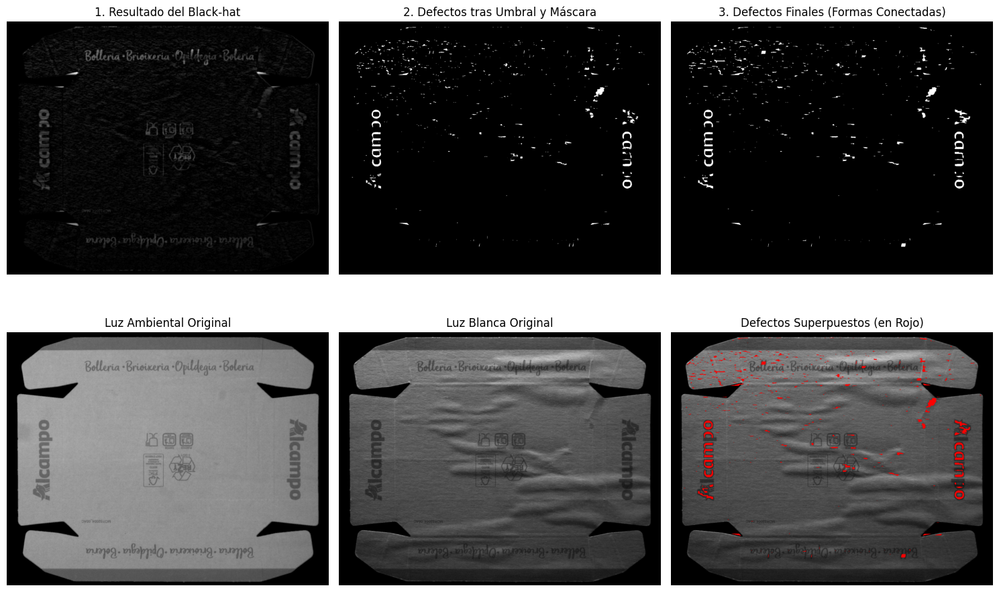

In [58]:
blur_ambient = cv.GaussianBlur(ambient_image, (5, 5), 0)
blur_white = cv.GaussianBlur(white_image, (7, 7), 0)

# --- 3. Crear la Máscara de Impresión (Esta lógica es correcta y se mantiene) ---
# Usamos Canny solo en la imagen ambiental para saber dónde está la impresión.
edges_ambient = cv.Canny(blur_ambient, 50, 100)
print_mask_kernel = np.ones((7, 7), np.uint8)
mask_print_area = cv.dilate(edges_ambient, print_mask_kernel, iterations=1)
inverted_mask = cv.bitwise_not(mask_print_area)


# --- 4. Detectar la FORMA de los Defectos con Black-hat (MÉTODO NUEVO Y MEJORADO) ---
# Se reemplaza Canny en la imagen blanca por este nuevo método.

# Paso 4.1: Definir un kernel rectangular para detectar formas alargadas.
# La anchura (50) captura la longitud de las arrugas. La altura (5) evita unir arrugas distintas.
# ¡Este es un parámetro clave para ajustar!
blackhat_kernel = cv.getStructuringElement(cv.MORPH_RECT, (50, 5))

# Paso 4.2: Aplicar la transformación Black-hat para resaltar los valles de las arrugas.
blackhat_result = cv.morphologyEx(blur_white, cv.MORPH_BLACKHAT, blackhat_kernel)

# Paso 4.3: Binarizar el resultado con un umbral para crear una máscara de defectos cruda.
# El valor del umbral (ej. 15) determina la sensibilidad. Ajústalo según sea necesario.
threshold_value = 15
_, defects_raw = cv.threshold(blackhat_result, threshold_value, 255, cv.THRESH_BINARY)

# Paso 4.4: Usar la máscara de impresión para eliminar el ruido en las zonas del texto.
defects_no_print = cv.bitwise_and(defects_raw, defects_raw, mask=inverted_mask)

# Paso 4.5: Limpieza final con un cierre morfológico para unir fragmentos y eliminar ruido.
# El kernel alargado ayuda a conectar las formas horizontalmente.
closing_kernel = np.ones((5, 17), np.uint8)
defects_final = cv.morphologyEx(defects_no_print, cv.MORPH_CLOSE, closing_kernel)


# --- 5. Visualización de Resultados (Adaptada al nuevo flujo de trabajo) ---
plt.figure(figsize=(15, 10))

# Fila superior: Pasos clave del nuevo método
plt.subplot(2, 3, 1)
plt.title('1. Resultado del Black-hat')
plt.imshow(blackhat_result, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title('2. Defectos tras Umbral y Máscara')
plt.imshow(defects_no_print, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title('3. Defectos Finales (Formas Conectadas)')
plt.imshow(defects_final, cmap='gray')
plt.axis('off')

# Fila inferior: Comparativa de originales y resultado final
plt.subplot(2, 3, 4)
plt.title('Luz Ambiental Original')
plt.imshow(cv.cvtColor(ambient_image, cv.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title('Luz Blanca Original')
plt.imshow(cv.cvtColor(white_image, cv.COLOR_BGR2RGB))
plt.axis('off')

# Superponer los defectos en la imagen original
# CORRECCIÓN: Se usa .copy() para no modificar la imagen original.
overlay_image = cv.cvtColor(white_image, cv.COLOR_GRAY2BGR)
overlay_image[defects_final != 0] = [0, 0, 255] # Defectos en rojo (formato BGR)

plt.subplot(2, 3, 6)
plt.title('Defectos Superpuestos (en Rojo)')
plt.imshow(cv.cvtColor(overlay_image, cv.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()